## Resnet50

True


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:08<00:00, 11.7MB/s]


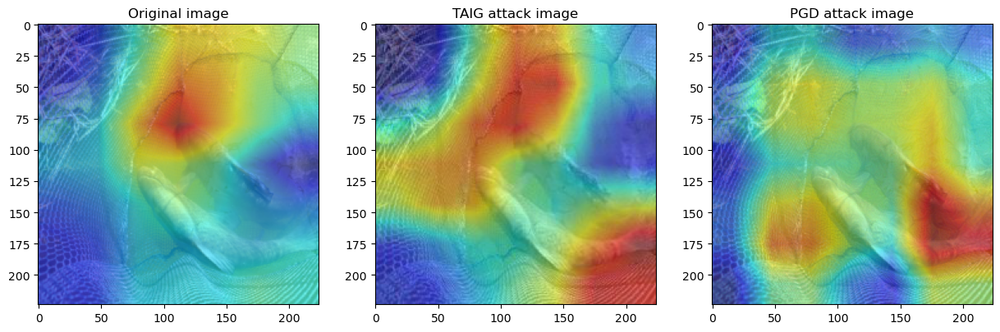

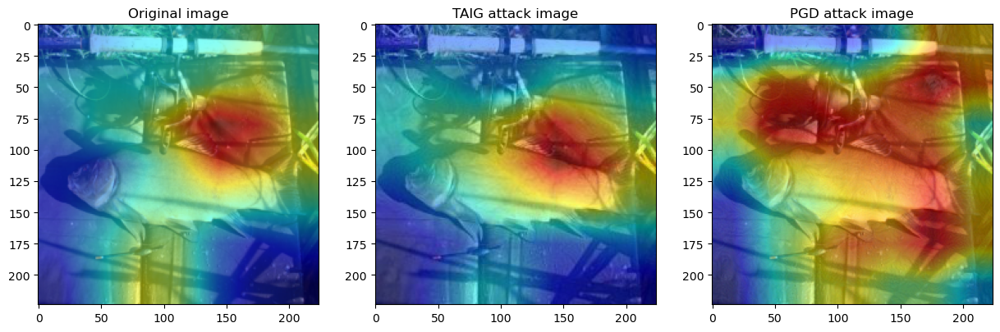

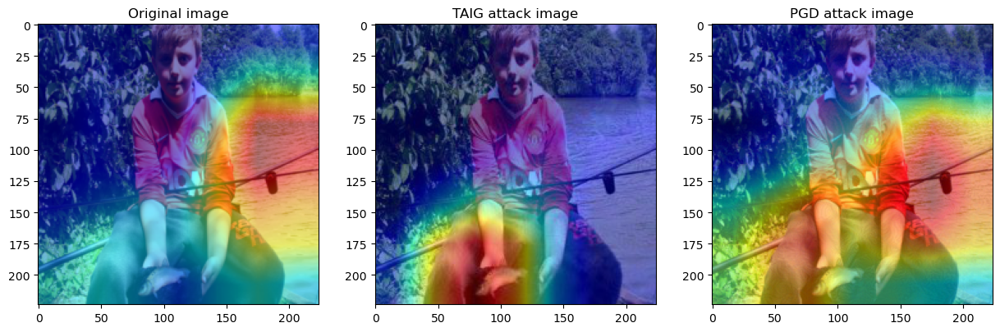

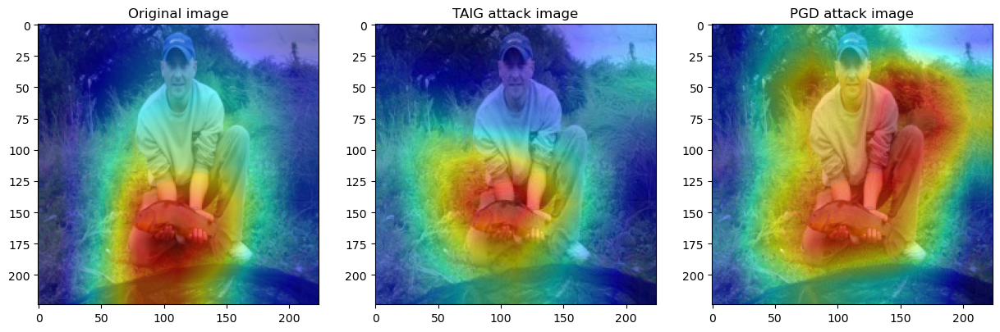

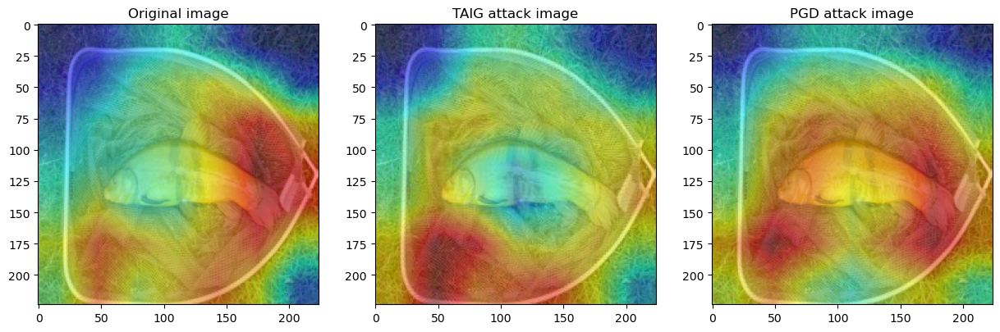

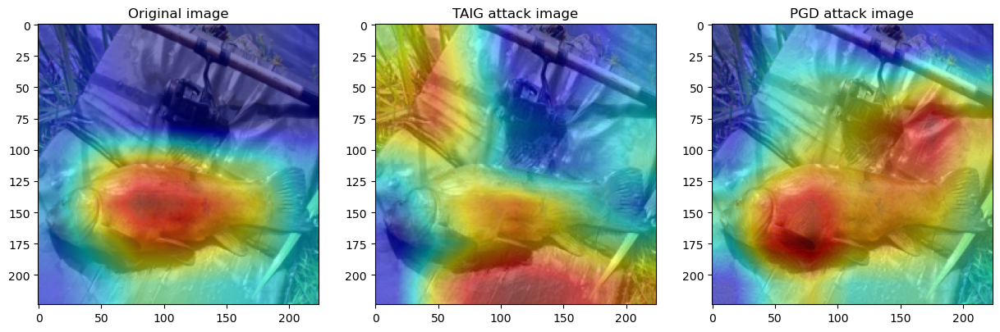

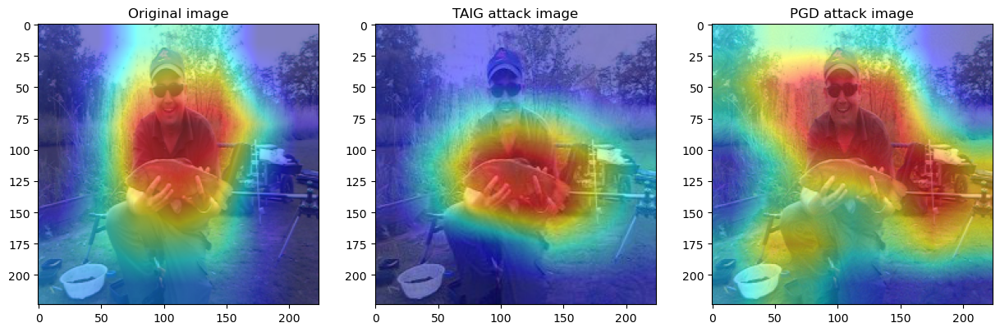

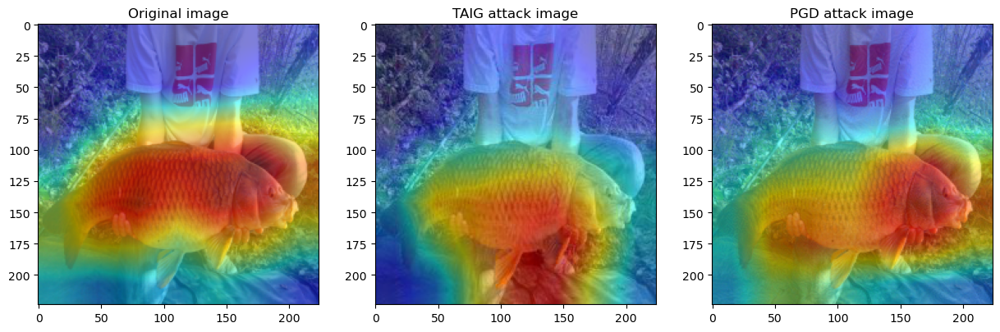

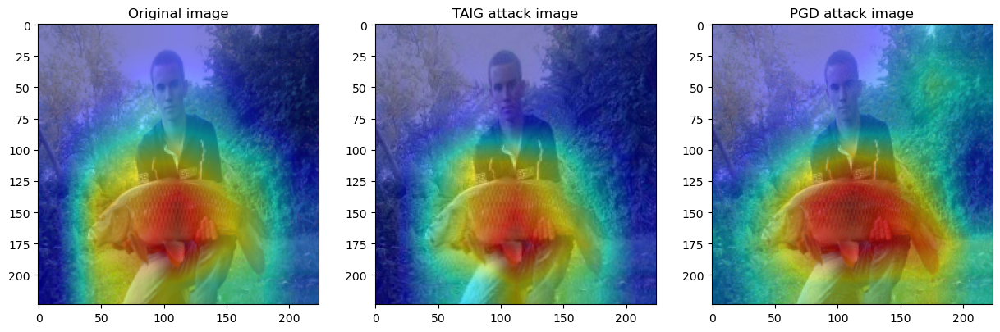

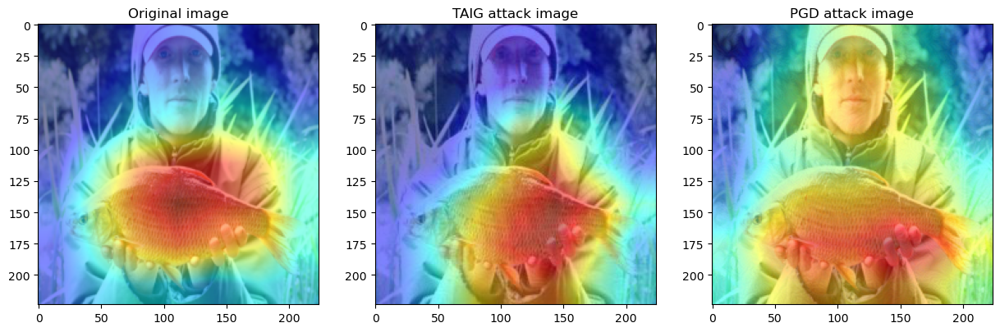

In [4]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet50
from PGD import PGD

    
cuda = True if torch.cuda.is_available() else False
print(cuda)


preprocess = transforms.Compose([
    transforms.Resize((224,224)), # Resize with 224
    transforms.ToTensor(), # making the matrix shape to [C,H,W] and range of [0,1]
])

norm = transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))


val_imagefolder = ImageFolder(root='/workspace/my_data/imagenet/val', transform=preprocess)
val_dataloader = DataLoader(val_imagefolder, batch_size=1, shuffle=False)

TAIG_imagefolder = ImageFolder(root='/workspace/my_data/TAIG_test', transform=preprocess)
TAIG_dataloader = DataLoader(TAIG_imagefolder, batch_size=1, shuffle=False)


model = models.resnet50(pretrained=True)
model.eval() # batch가 1개일 때 가능하게함 Batchnorm, Dropout 사용안함
target_layers = [model.layer4[-1]]
# Construct the CAM object once, and then re-use it on many images:
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=cuda)
attack = PGD(model, cuda=cuda)

iter = 0
for (ori_imgs, ori_labels), (TAIG_imgs,_) in zip(val_dataloader, TAIG_dataloader):

    
    input_tensor = ori_imgs
    pgd_input_tensor = attack(ori_imgs, ori_labels)
    # Note: input_tensor can be a batch tensor with several images!

    
    

    # You can also use it within a with statement, to make sure it is freed,
    # In case you need to re-create it inside an outer loop:
    # with GradCAM(model=model, target_layers=target_layers, use_cuda=args.use_cuda) as cam:
    #   ...

    # We have to specify the target we want to generate
    # the Class Activation Maps for.
    # If targets is None, the highest scoring category
    # will be used for every image in the batch.
    # Here we use ClassifierOutputTarget, but you can define your own custom targets
    # That are, for example, combinations of categories, or specific outputs in a non standard model.

    # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
    ori_grayscale_cam = cam(input_tensor=input_tensor)
    TAIG_grayscale_cam = cam(TAIG_imgs)
    pgd_grayscale_cam = cam(pgd_input_tensor)

    # In this example grayscale_cam has only one image in the batch:
    grayscale_cam = ori_grayscale_cam[0, :]
    TAIG_grayscale_cam = TAIG_grayscale_cam[0, :]
    pgd_grayscale_cam = pgd_grayscale_cam[0,:]
    
    
    img = ori_imgs.squeeze(0).permute(1,2,0).numpy()
    TAIG_img = TAIG_imgs.squeeze(0).permute(1,2,0).numpy()
    pgd_img = pgd_input_tensor.detach().cpu().squeeze(0).permute(1,2,0).numpy()
    visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)
    TAIG_visualization = show_cam_on_image(TAIG_img, TAIG_grayscale_cam, use_rgb=True)
    pgd_visualization = show_cam_on_image(pgd_img, pgd_grayscale_cam, use_rgb=True)

    
    fig, axs = plt.subplots(1,3, figsize = (15,5))
    axs[0].imshow(visualization)
    axs[0].set_title('Original image')
    axs[1].imshow(TAIG_visualization)
    axs[1].set_title('TAIG attack image')
    axs[2].imshow(pgd_visualization)
    axs[2].set_title('PGD attack image')
    plt.show()
    iter += 1
    if iter == 10:
        break

## VGG19

True


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:50<00:00, 11.3MB/s]   


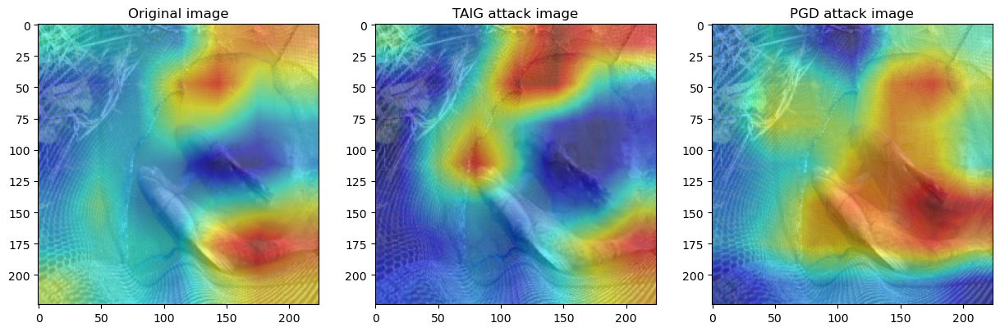

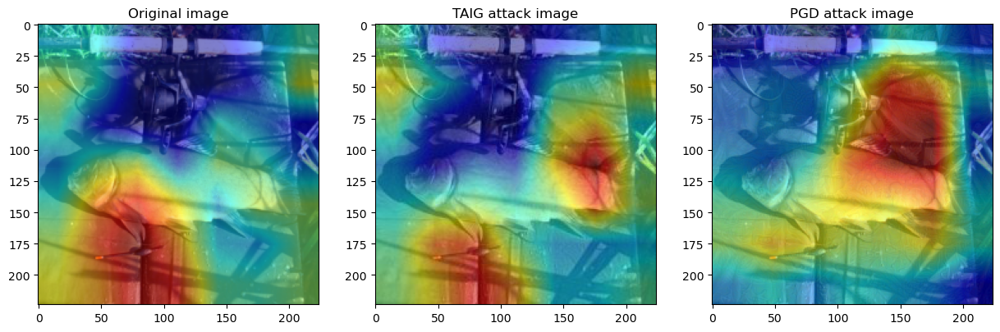

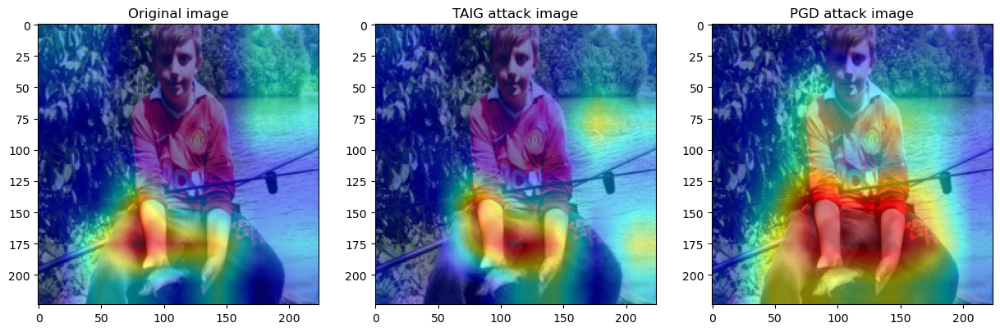

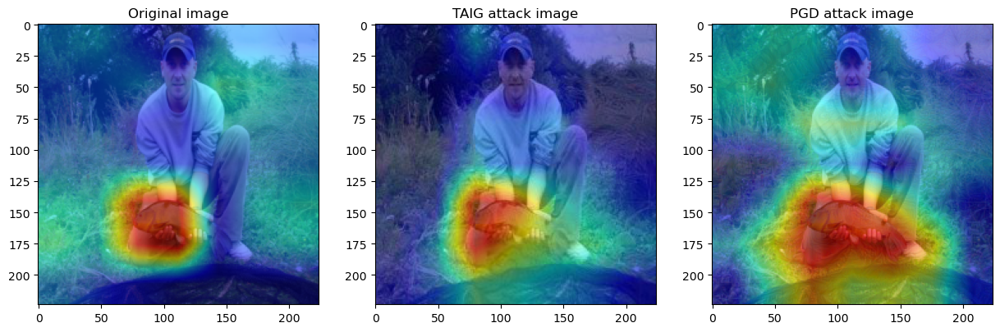

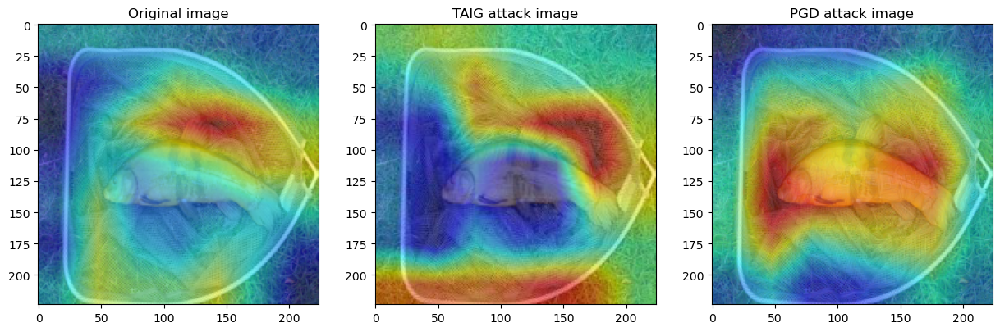

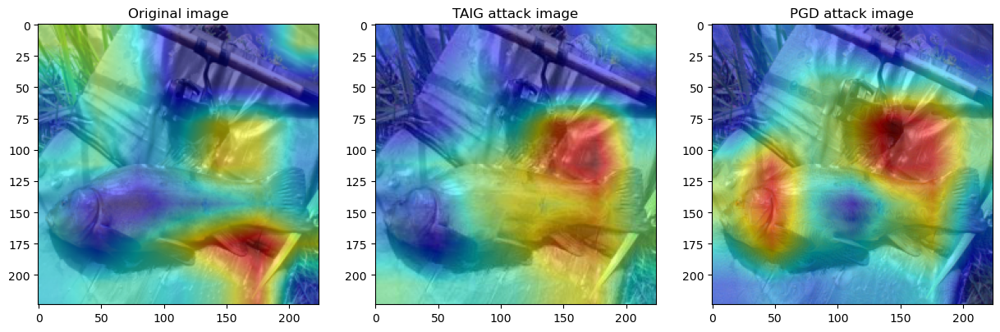

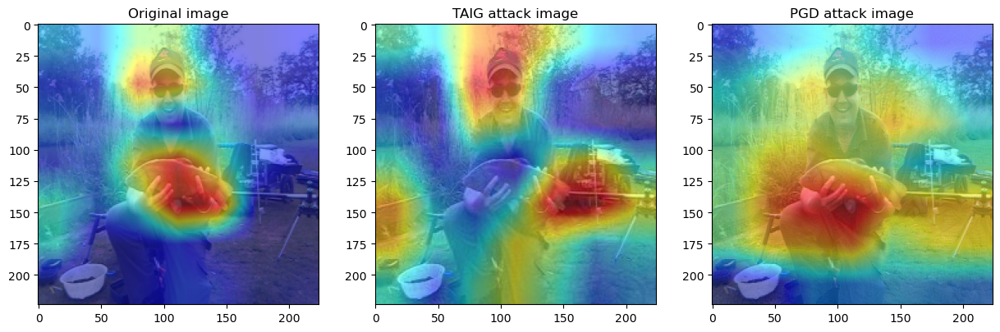

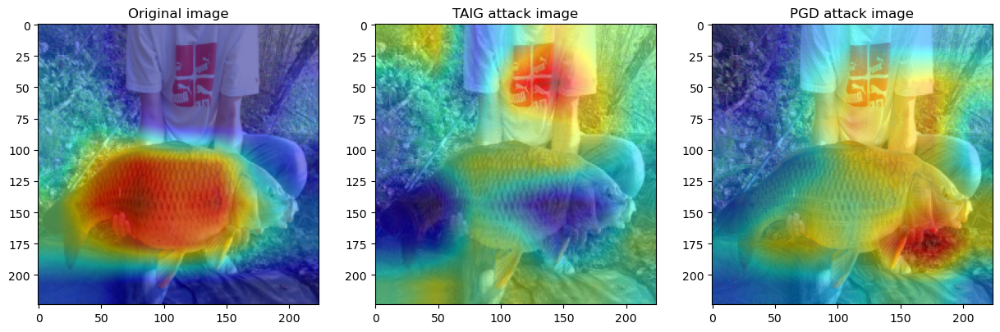

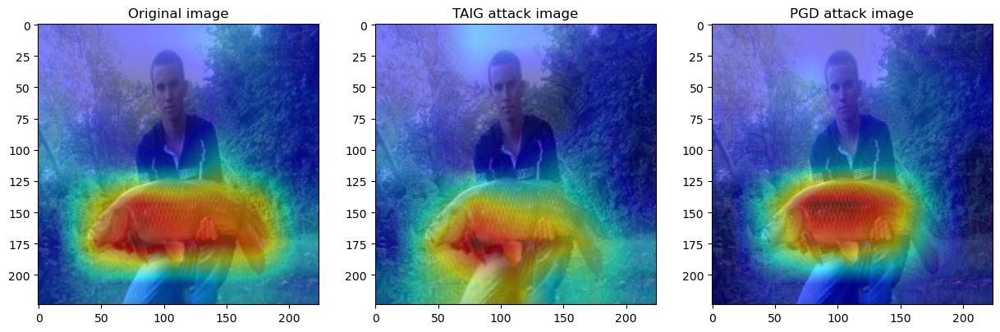

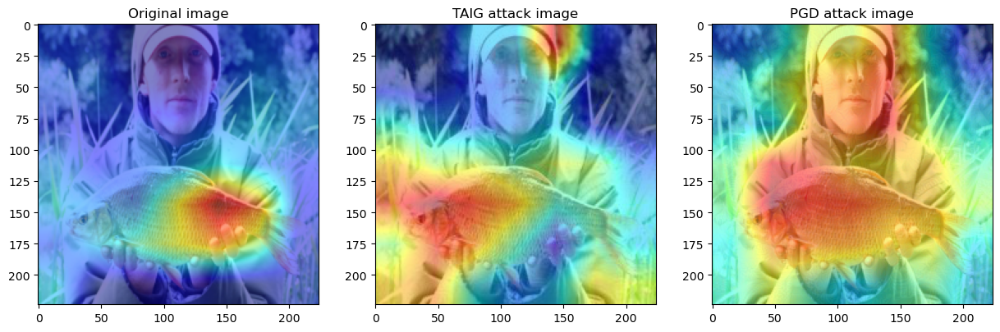

In [5]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

    
cuda = True if torch.cuda.is_available() else False
print(cuda)


preprocess = transforms.Compose([
    transforms.Resize((224,224)), # Resize with 224
    transforms.ToTensor(), # making the matrix shape to [C,H,W] and range of [0,1]
])

norm = transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))


val_imagefolder = ImageFolder(root='/workspace/my_data/imagenet/val', transform=preprocess)
val_dataloader = DataLoader(val_imagefolder, batch_size=1, shuffle=False)

TAIG_imagefolder = ImageFolder(root='/workspace/my_data/TAIG_test', transform=preprocess)
TAIG_dataloader = DataLoader(TAIG_imagefolder, batch_size=1, shuffle=False)


model = models.vgg19(pretrained=True)
model.eval() # batch가 1개일 때 가능하게함 Batchnorm, Dropout 사용안함
target_layers = [model.features[-1]]
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=cuda)
attack = PGD(model, cuda=cuda)

iter = 0
for (ori_imgs, ori_labels), (TAIG_imgs,_) in zip(val_dataloader, TAIG_dataloader):

    
    input_tensor = ori_imgs
    pgd_input_tensor = attack(ori_imgs, ori_labels)
    # Note: input_tensor can be a batch tensor with several images!

    
    

    # You can also use it within a with statement, to make sure it is freed,
    # In case you need to re-create it inside an outer loop:
    # with GradCAM(model=model, target_layers=target_layers, use_cuda=args.use_cuda) as cam:
    #   ...

    # We have to specify the target we want to generate
    # the Class Activation Maps for.
    # If targets is None, the highest scoring category
    # will be used for every image in the batch.
    # Here we use ClassifierOutputTarget, but you can define your own custom targets
    # That are, for example, combinations of categories, or specific outputs in a non standard model.

    # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
    ori_grayscale_cam = cam(input_tensor=input_tensor)
    TAIG_grayscale_cam = cam(TAIG_imgs)
    pgd_grayscale_cam = cam(pgd_input_tensor)

    # In this example grayscale_cam has only one image in the batch:
    grayscale_cam = ori_grayscale_cam[0, :]
    TAIG_grayscale_cam = TAIG_grayscale_cam[0, :]
    pgd_grayscale_cam = pgd_grayscale_cam[0,:]
    
    
    img = ori_imgs.squeeze(0).permute(1,2,0).numpy()
    TAIG_img = TAIG_imgs.squeeze(0).permute(1,2,0).numpy()
    pgd_img = pgd_input_tensor.detach().cpu().squeeze(0).permute(1,2,0).numpy()
    visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)
    TAIG_visualization = show_cam_on_image(TAIG_img, TAIG_grayscale_cam, use_rgb=True)
    pgd_visualization = show_cam_on_image(pgd_img, pgd_grayscale_cam, use_rgb=True)

    
    fig, axs = plt.subplots(1,3, figsize = (15,5))
    axs[0].imshow(visualization)
    axs[0].set_title('Original image')
    axs[1].imshow(TAIG_visualization)
    axs[1].set_title('TAIG attack image')
    axs[2].imshow(pgd_visualization)
    axs[2].set_title('PGD attack image')
    plt.show()
    iter += 1
    if iter == 10:
        break

## Cifar10 adversarial training model

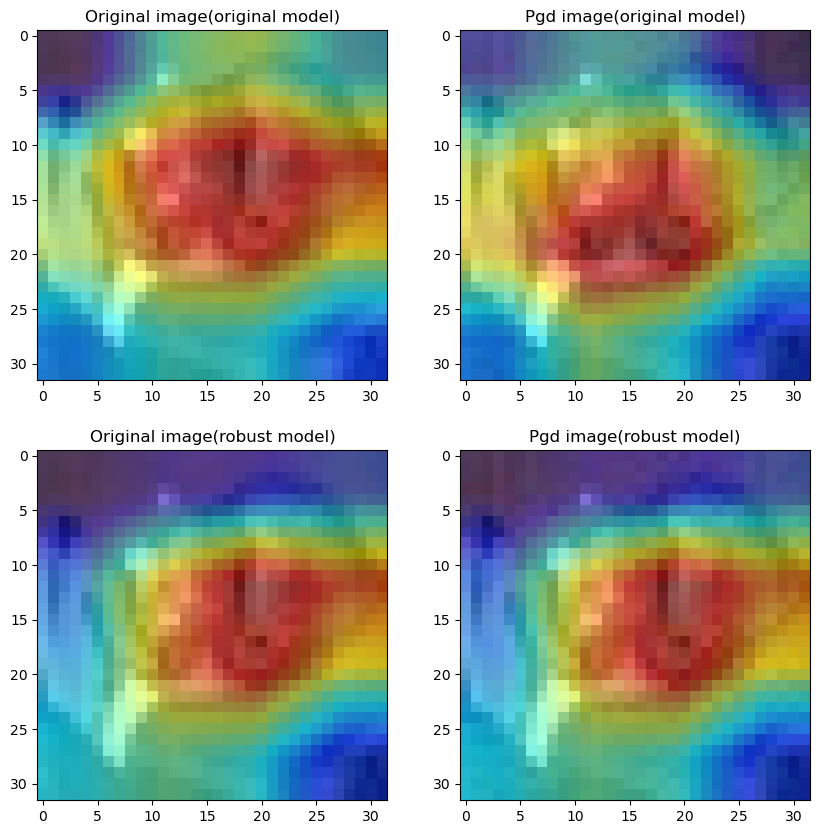

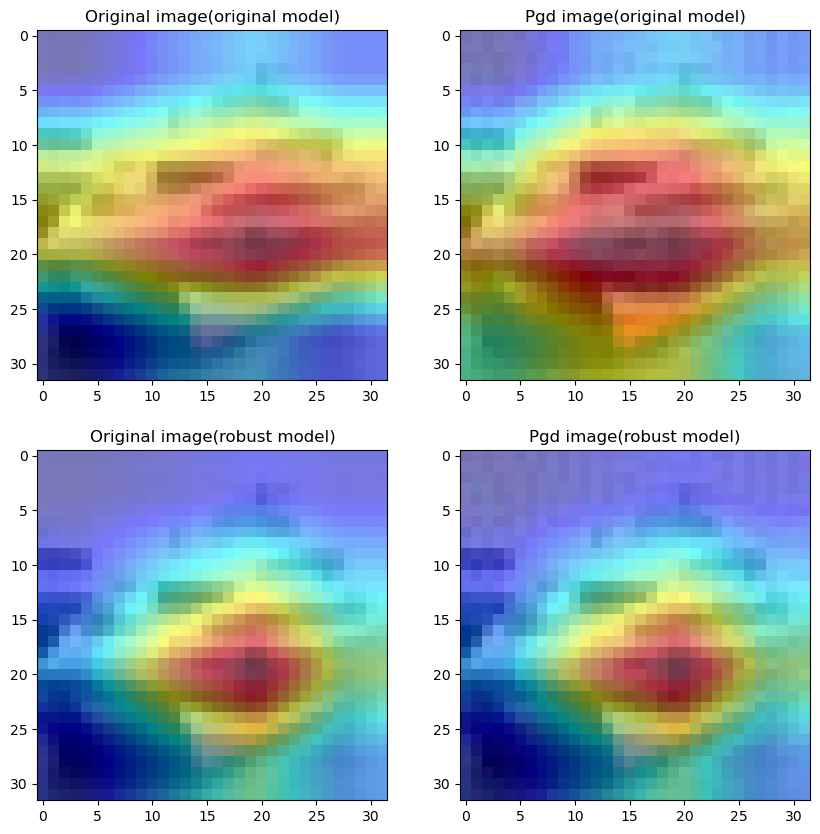

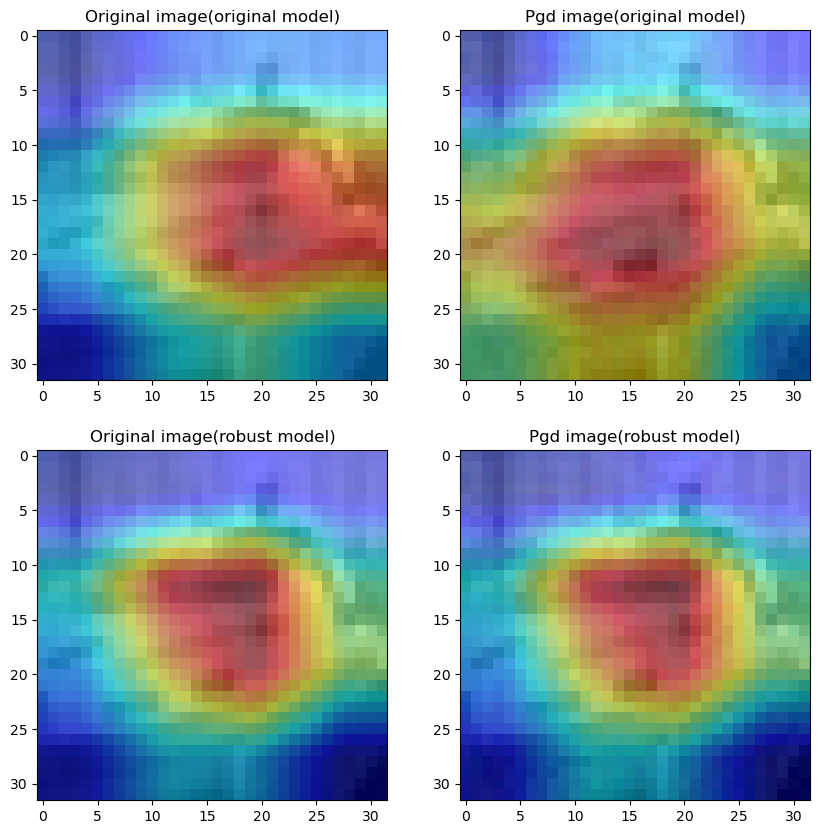

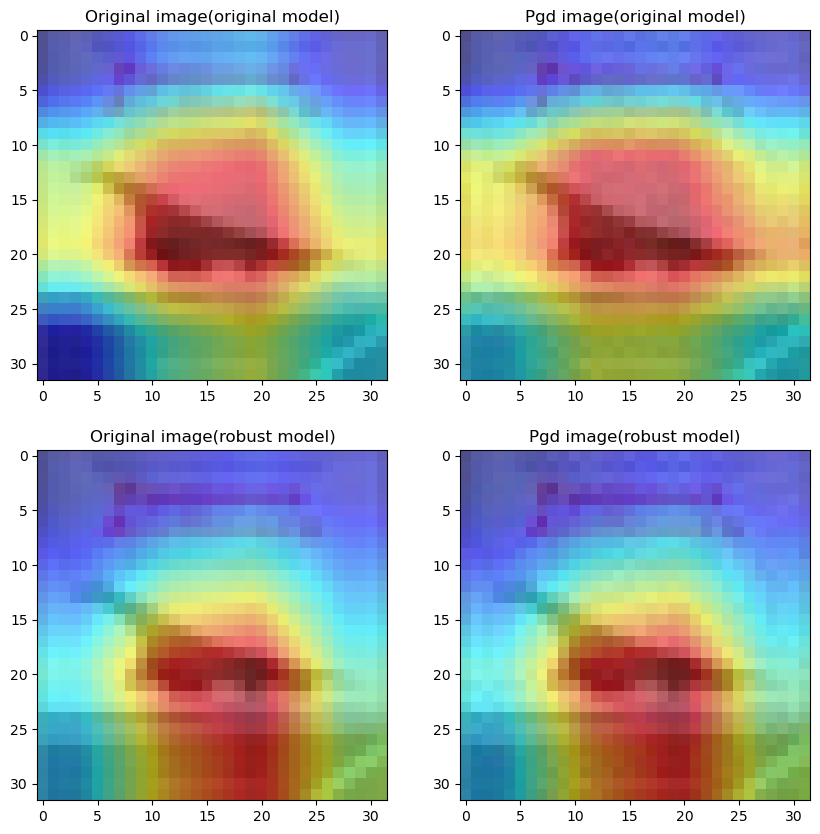

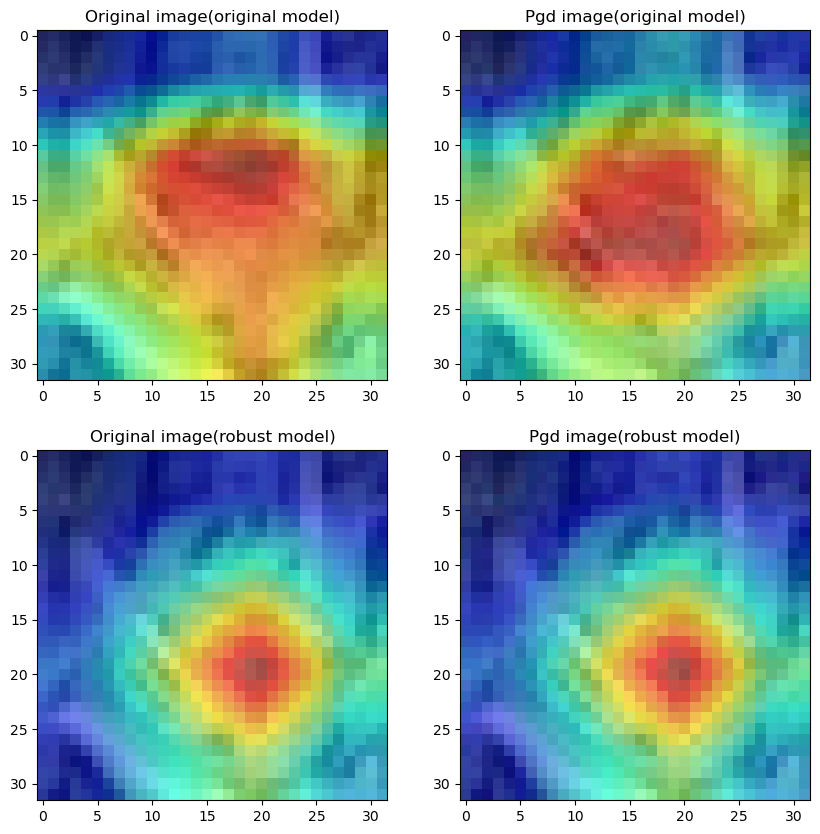

...

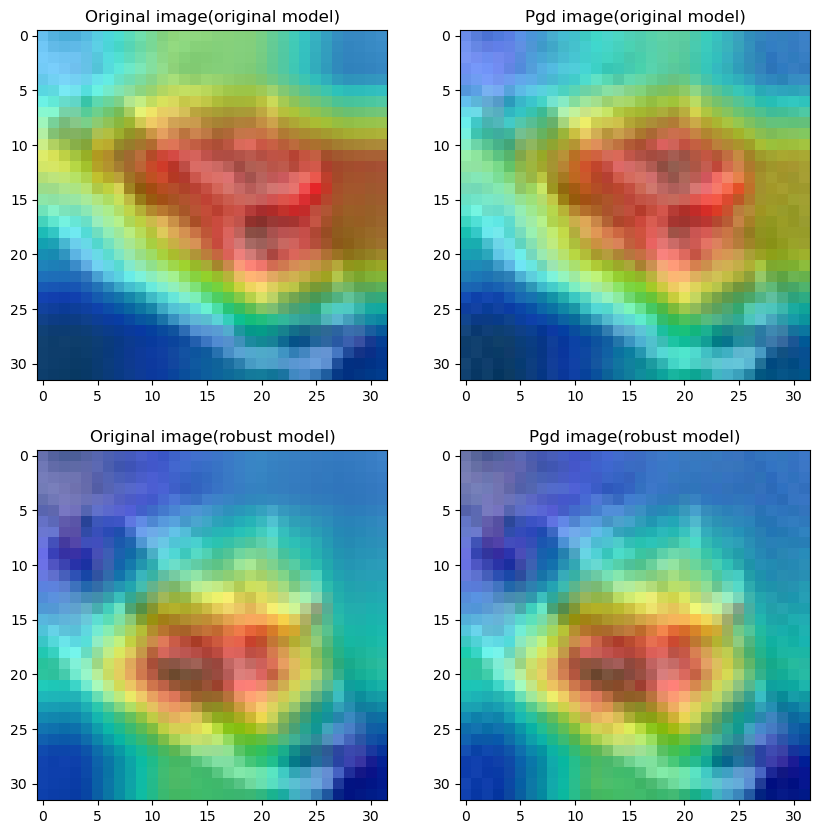

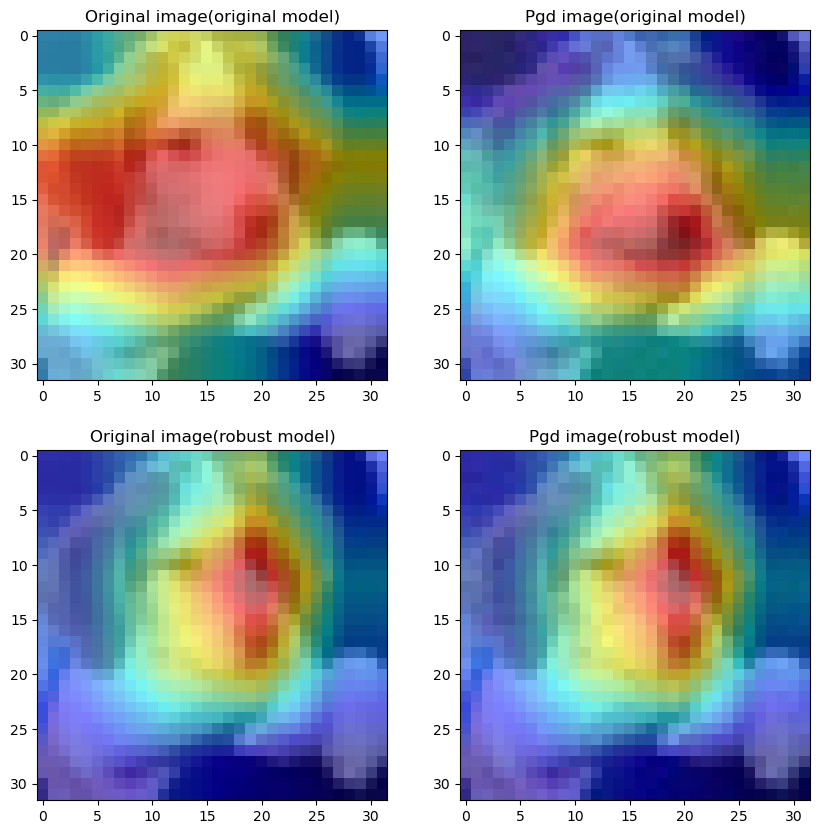

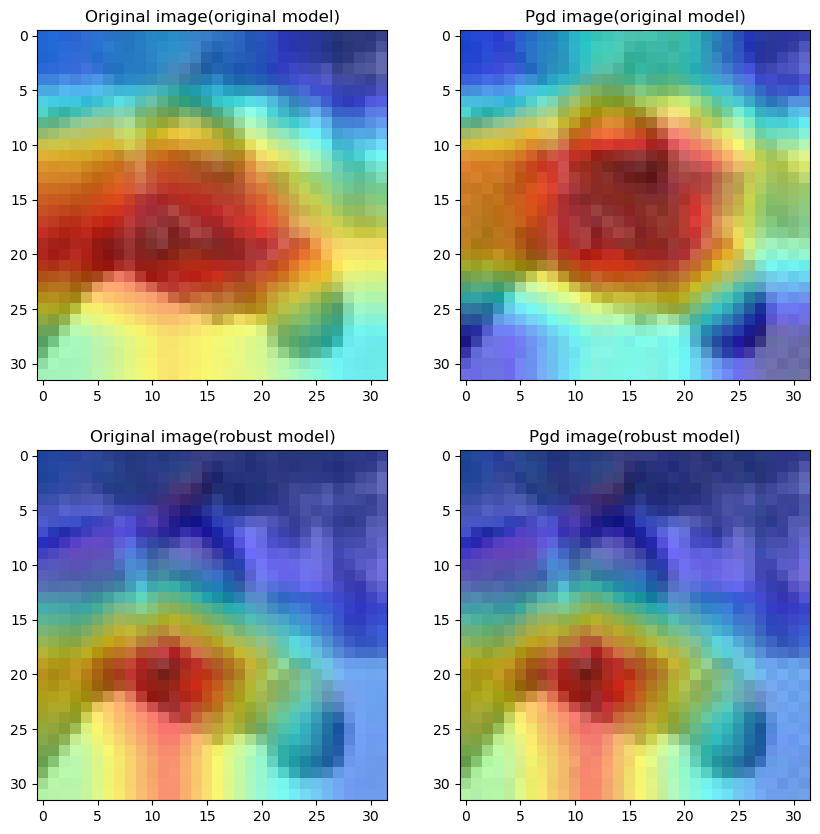

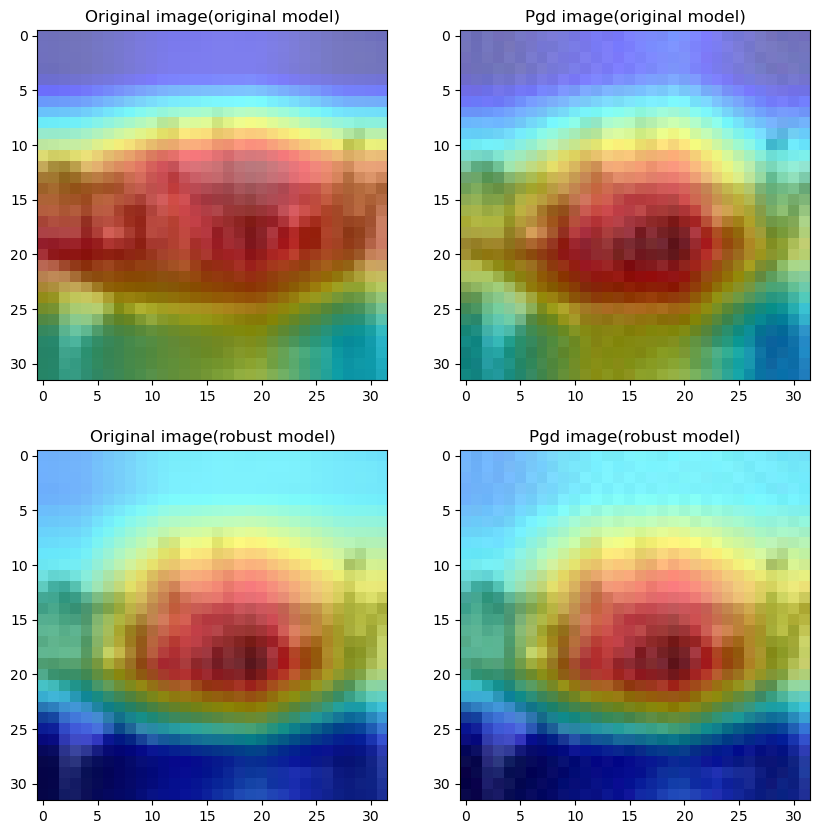

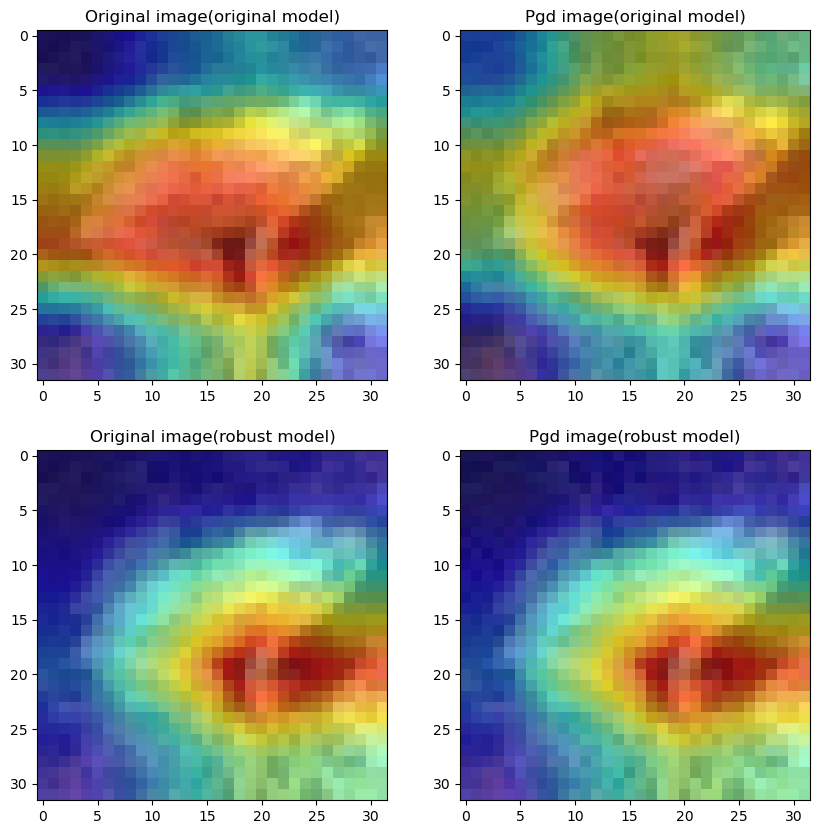

In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from PGD import PGD
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import os

from my_resnet import *
from models import *

cuda = 'cuda' if torch.cuda.is_available() else 'cpu'

transform_test = transforms.Compose([
    transforms.ToTensor(),
])

test_dataset = torchvision.datasets.CIFAR10(root='/workspace/my_data', train=False, download=False, transform=transform_test)

test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=4)

robust_model = ResNet18()
checkpoint_path1 = '/workspace/checkpoint/pgd_adversarial_training'
checkpoint1 = torch.load(checkpoint_path1)['net']
for key in list(checkpoint1.keys()):
    checkpoint1[key.replace('module.', '')] = checkpoint1.pop(key)
robust_model.load_state_dict(checkpoint1, strict=False)
robust_model = robust_model.to(cuda)
robust_model.eval()

model = ResNet18()
checkpoint_path2 = '/workspace/checkpoint/resnet18_cifar10'
checkpoint2 = torch.load(checkpoint_path2)['net']
for key in list(checkpoint2.keys()):
    checkpoint2[key.replace('module.', '')] = checkpoint2.pop(key)
model.load_state_dict(checkpoint2, strict=False)
model = model.to(cuda)
model.eval()

robust_model_target_layers = [robust_model.layer4[-1]]
robust_cam = GradCAM(model=robust_model, target_layers=robust_model_target_layers, use_cuda=cuda)
original_model_target_layers = [model.layer4[-1]]
ori_cam = GradCAM(model=model, target_layers=original_model_target_layers, use_cuda=cuda)
attack = PGD(model, cuda=cuda)

iter = 0
for ori_imgs, ori_labels in test_loader:

    
    input_tensor = ori_imgs
    pgd_input_tensor = attack(ori_imgs, ori_labels)
    # Note: input_tensor can be a batch tensor with several images!

    
    

    # You can also use it within a with statement, to make sure it is freed,
    # In case you need to re-create it inside an outer loop:
    # with GradCAM(model=model, target_layers=target_layers, use_cuda=args.use_cuda) as cam:
    #   ...

    # We have to specify the target we want to generate
    # the Class Activation Maps for.
    # If targets is None, the highest scoring category
    # will be used for every image in the batch.
    # Here we use ClassifierOutputTarget, but you can define your own custom targets
    # That are, for example, combinations of categories, or specific outputs in a non standard model.

    # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
    ori_img_ori_model = ori_cam(input_tensor=input_tensor)
    pgd_img_ori_model = ori_cam(pgd_input_tensor)
    ori_img_robust_model = robust_cam(input_tensor)
    pgd_img_robust_model = robust_cam(pgd_input_tensor)

    # In this example grayscale_cam has only one image in the batch:
    ori_img_ori_model = ori_img_ori_model[0, :]
    pgd_img_ori_model = pgd_img_ori_model[0, :]
    ori_img_robust_model = ori_img_robust_model[0,:]
    pgd_img_robust_model = pgd_img_robust_model[0,:]
    
    img = ori_imgs.squeeze(0).permute(1,2,0).numpy()
    pgd_img = pgd_input_tensor.detach().cpu().squeeze(0).permute(1,2,0).numpy()
    
    ori_img_ori_model_cam = show_cam_on_image(img, ori_img_ori_model, use_rgb=True)
    pgd_img_ori_model_cam = show_cam_on_image(pgd_img, pgd_img_ori_model, use_rgb=True)
    ori_img_robust_model_cam = show_cam_on_image(img, ori_img_robust_model, use_rgb=True)
    pgd_img_robust_model_cam = show_cam_on_image(pgd_img, pgd_img_robust_model, use_rgb=True)

    fig, axs = plt.subplots(2,2, figsize = (10,10))
    axs[0,0].imshow(ori_img_ori_model_cam)
    axs[0,0].set_title('Original image(original model)')
    axs[0,1].imshow(pgd_img_ori_model_cam)
    axs[0,1].set_title('Pgd image(original model)')
    axs[1,0].imshow(ori_img_robust_model_cam)
    axs[1,0].set_title('Original image(robust model)')
    axs[1,1].imshow(pgd_img_robust_model_cam)
    axs[1,1].set_title('Pgd image(robust model)')
    plt.show()
    iter += 1
    if iter == 20:
        break